In [297]:
import os
import sys

sys.path.append(os.path.abspath(os.path.join('..'))) # imports top level

In [298]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import display
import scipy
from collections import defaultdict

import random

In [299]:
from joblib import load

In [300]:
pop = load("trained_population_129_data_for_nsgaii_300ps.joblib")

In [301]:
pop

[{'id': 242,
  'fuels_gnome': array([5.98, 31.76, 31.99, 55.68, 49.83, 14.47, 45.96, 49.94, 23.96, 0.0,
         29.06, 55.78, 49.41, 44.17, 14.43, 48.68, 0.0, 6.15, 24.11, 29.16],
        dtype=object),
  'core_burnup': 30.5,
  'p_margin': 0.8247830024415129,
  'k_fa_max': 0.7766730522216108,
  'k_fa_min': 0.7291046245823836,
  'k_quarter': 0.9884143769376607,
  'k_sym': 0.6993883160308957,
  'k_left_right': 0.994006944906566,
  'fitness_score': 0.8652913868448378},
 {'id': 154,
  'fuels_gnome': array([31.76, 0.0, 55.78, 24.11, 49.83, 14.47, 45.96, 49.94, 23.96, 29.16,
         31.99, 55.68, 49.41, 44.17, 14.43, 48.68, 29.06, 6.15, 0.0, 5.98],
        dtype=object),
  'core_burnup': 30.5,
  'p_margin': 0.8008244714019384,
  'k_fa_max': 0.928512930192148,
  'k_fa_min': 0.6955415568162095,
  'k_quarter': 0.9333371476597626,
  'k_sym': 0.7330734056797646,
  'k_left_right': 0.9580096152279073,
  'fitness_score': 0.8646327062349235},
 {'id': 3,
  'fuels_gnome': array([55.68, 0.0, 31.99, 24

In [325]:
weights = {
    # "p_margin": 0.10, # use fuel burnup coef instead of this
    # "k_fa_max": 0.10,
    "k_quarter": 1, # modify in order to estimate this symmetry more accurate 
    "k_sym": 1,
    "k_sided": 1
}

scores = []
k_sym = []
k_quarter = []
p_margin = []
k_fa_max = []
k_sided = []

for i in pop:
    scores.append(
        i["fitness_score"] 
    )
    k_sym.append(
        i["k_sym"] * weights["k_sym"]
    )
    k_quarter.append(
        i["k_quarter"] * weights["k_quarter"]
    )
    # p_margin.append(
    #     i["p_margin"] * weights["p_margin"]
    # )
    
    # k_fa_max.append(
    #     i["k_fa_max"] * weights["k_fa_max"]
    # )
    
    k_sided.append(
        i["k_left_right"] * weights["k_sided"]
    )

In [326]:
k_quarter=np.array(k_quarter)
k_sym=np.array(k_sym)
scores=np.array(scores)
p_margin=np.array(p_margin)
k_fa_max=np.array(k_fa_max)

<Axes: >

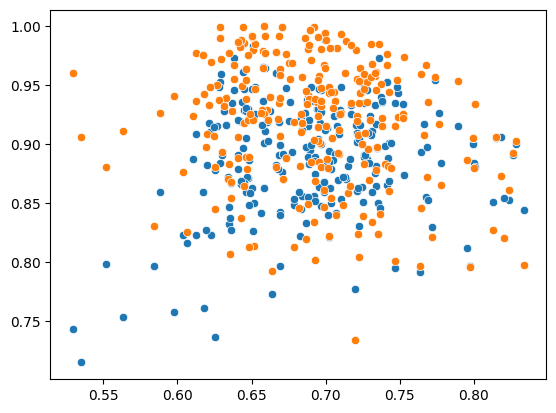

In [327]:
sns.scatterplot(x=k_sym, y=k_quarter)
sns.scatterplot(x=k_sym, y=k_sided)

# NonDominated sort

In [305]:
objective_functions = [
    # "p_margin",
    # "k_fa_max",
    
    "k_sym",
    "k_quarter",
    # "k_left_right"
]

def check_dominance(p, q):
    p_counter, q_counter = 0, 0
    
    for of1 in objective_functions:
        if p[of1] >= q[of1]:
            q_counter += 1
        else:
            p_counter += 1
    if p_counter == 0:
        return True
    elif q_counter == 0:
        return False
    return "nondominance"

In [306]:
S = {}
F1 = []
ed_pop = pop.copy()
for nump in range(len(ed_pop)):
    S[
        ed_pop[nump]["id"]
    ] = defaultdict(list)
    Sp = []
    npp = 0
    ed_pop[nump]["nq"] = 0
    for numq in range(len(ed_pop)):
        
        if ed_pop[nump]["id"] == ed_pop[numq]["id"]:
            continue
        
        dominance = check_dominance(
            ed_pop[nump],
            ed_pop[numq],
        )
        if dominance == True:
            Sp.append(
                ed_pop[numq]
            )
        elif dominance == False:
            npp += 1
            ed_pop[nump]["nq"] += 1
    S[
        ed_pop[nump]["id"]
    ]["np"] = npp
    
    if npp == 0:
        F1.append(
            ed_pop[nump].copy()
        )
    
    S[
        ed_pop[nump]["id"]
    ]["Sp"] = Sp
S["F1"] = F1

In [307]:
F1

[{'id': 242,
  'fuels_gnome': array([5.98, 31.76, 31.99, 55.68, 49.83, 14.47, 45.96, 49.94, 23.96, 0.0,
         29.06, 55.78, 49.41, 44.17, 14.43, 48.68, 0.0, 6.15, 24.11, 29.16],
        dtype=object),
  'core_burnup': 30.5,
  'p_margin': 0.8247830024415129,
  'k_fa_max': 0.7766730522216108,
  'k_fa_min': 0.7291046245823836,
  'k_quarter': 0.9884143769376607,
  'k_sym': 0.6993883160308957,
  'k_left_right': 0.994006944906566,
  'fitness_score': 0.8652913868448378,
  'nq': 0},
 {'id': 149,
  'fuels_gnome': array([6.15, 31.99, 55.78, 5.98, 49.83, 14.47, 45.96, 49.94, 23.96, 24.11,
         29.16, 29.06, 49.41, 44.17, 14.43, 48.68, 0.0, 31.76, 55.68, 0.0],
        dtype=object),
  'core_burnup': 30.5,
  'p_margin': 0.8308242167885409,
  'k_fa_max': 0.8537386312334949,
  'k_fa_min': 0.6782639551263685,
  'k_quarter': 0.9264660680891901,
  'k_sym': 0.7766163053307306,
  'k_left_right': 0.9173730859785261,
  'fitness_score': 0.863519913106125,
  'nq': 0},
 {'id': 177,
  'fuels_gnome': arra

In [308]:
S

{242: defaultdict(list,
             {'np': 0,
              'Sp': [{'id': 3,
                'fuels_gnome': array([55.68, 0.0, 31.99, 24.11, 49.83, 14.47, 45.96, 49.94, 23.96, 31.76,
                       5.98, 29.16, 49.41, 44.17, 14.43, 48.68, 6.15, 0.0, 55.78, 29.06],
                      dtype=object),
                'core_burnup': 30.5,
                'p_margin': 0.8497233743758746,
                'k_fa_max': 0.9545679751029656,
                'k_fa_min': 0.6272795296576987,
                'k_quarter': 0.9602904335527586,
                'k_sym': 0.6667393037889582,
                'k_left_right': 0.9784098322618576,
                'fitness_score': 0.864266302475286,
                'nq': 2},
               {'id': 200,
                'fuels_gnome': array([24.11, 31.76, 55.68, 0.0, 49.83, 14.47, 45.96, 49.94, 23.96, 29.16,
                       5.98, 31.99, 49.41, 44.17, 14.43, 48.68, 0.0, 29.06, 6.15, 55.78],
                      dtype=object),
                'core_bu

In [309]:
S[100]

defaultdict(list,
            {'np': 60,
             'Sp': [{'id': 223,
               'fuels_gnome': array([0.0, 55.68, 31.76, 29.06, 49.83, 14.47, 45.96, 49.94, 23.96, 55.78,
                      24.11, 29.16, 49.41, 44.17, 14.43, 48.68, 6.15, 5.98, 0.0, 31.99],
                     dtype=object),
               'core_burnup': 30.5,
               'p_margin': 0.8024762597688095,
               'k_fa_max': 0.904391892099417,
               'k_fa_min': 0.6436886745979322,
               'k_quarter': 0.8705222172185875,
               'k_sym': 0.7137925431857403,
               'k_left_right': 0.9872768942280887,
               'fitness_score': 0.8434527414608168,
               'nq': 65},
              {'id': 27,
               'fuels_gnome': array([0.0, 31.99, 55.68, 55.78, 49.83, 14.47, 45.96, 49.94, 23.96, 29.16,
                      29.06, 24.11, 49.41, 44.17, 14.43, 48.68, 0.0, 6.15, 5.98, 31.76],
                     dtype=object),
               'core_burnup': 30.5,
         

In [310]:
# front counter
i = 1
F = {
    i: F1.copy()
}

run = True
while run:
    Q = []
    for p in F[i]:
        for numq in range(len(S[p["id"]]["Sp"])):
            S[p["id"]]["Sp"][numq]["nq"] -= 1
            if S[p["id"]]["Sp"][numq]["nq"] == 0:
                Q.append(
                    S[p["id"]]["Sp"][numq].copy()
                )
    if len(Q) == 0:
        break
    i += 1
    F[i] = Q.copy()
                

In [311]:
F.keys()

dict_keys([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29])

In [328]:
# display fronts
k_s, k_q = [], []
for k, v in F.items():
    
    k_s.append([i["k_sym"] for i in v])
    k_q.append([i["k_quarter"] for i in v])



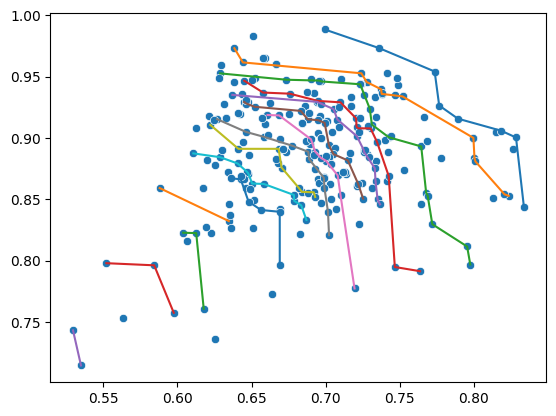

In [332]:
sns.scatterplot(x=k_sym, y=k_quarter)

for i in range(0, len(F), 2):
    
    sns.lineplot(x=k_s[i], y=k_q[i])


# plt.xlim(0.80, 1)
# plt.ylim(0.80, 1)

# Crowding distance selection

## Sort each objective in ascending order

In [248]:
def get_objective(objective_key, front):
    return [
        i[objective_key]
        for i in front
    ]

In [249]:
numpy.array([5,4,1,2])[numpy.argsort([5,4,1,2])]

array([1, 2, 4, 5])

23
53
[[0, 1, 6, 3, 2, 28, 5, 29, 4, 8, 9, 7, 23, 24, 25, 12, 26, 27, 10, 15, 14, 13, 11, 16, 20, 21, 22, 18, 19, 17], [22, 17, 19, 6, 27, 9, 18, 21, 25, 5, 20, 13, 26, 7, 8, 4, 16, 11, 14, 29, 15, 28, 10, 24, 12, 3, 23, 2, 1, 0], [19, 17, 21, 20, 18, 22, 11, 14, 16, 15, 23, 12, 24, 13, 10, 29, 26, 25, 27, 28, 0, 8, 7, 9, 1, 2, 4, 3, 5, 6]]
initial [0.         0.01200989 0.01807905 0.00197281 0.0064635  0.02307824
 0.01590028 0.         0.00715023 0.01209922 0.00295336 0.01766929
 0.02167361 0.02596304 0.02728415 0.01570397 0.0225922  0.02520966
 0.02001173 0.00464405 0.00399797 0.01551614 0.02122049 0.00551051
 0.00487174 0.0086528  0.00929856 0.00453809 0.00036833 0.00719705] 
 sorted [0.         0.01200989 0.0064635  0.00197281 0.00715023 0.01590028
 0.01807905 0.01766929 0.01209922 0.00295336 0.02001173 0.02122049
 0.01570397 0.01551614 0.00399797 0.00464405 0.00551051 0.00719705
 0.00453809 0.00036833 0.00487174 0.0086528  0.00929856 0.02167361
 0.02596304 0.02728415 0.0225922  0.

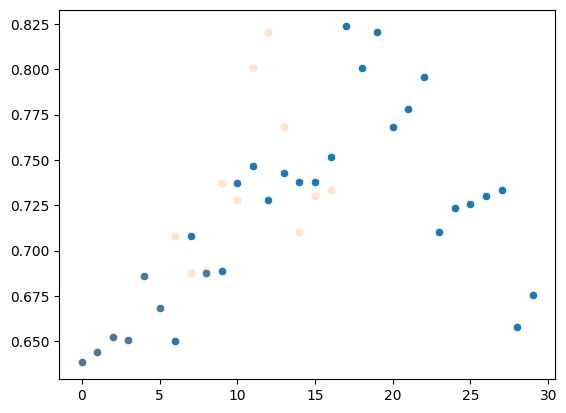

In [268]:
space_left = 70
filled = 0
for front in F.values():
    if filled+len(front) >= space_left:
        select_from_front = space_left - filled
        # iterate over objectives
        sorted_objs = [
            sorted(get_objective(ok, front))
            for ok in objective_functions
        ]
        initial_objs = [
            get_objective(ok, front)
            for ok in objective_functions
        ]
        sns.scatterplot(initial_objs[0])
        
        initial_inds = []
        for o in range(len(sorted_objs)):
            initial_ind = []
            for ni, i in enumerate(sorted_objs[o]):
                for nj, j in enumerate(initial_objs[o]):
                    if i == j and not nj in initial_ind:
                        # print(i,j)
                        initial_ind.append(nj)
                        # break
            initial_inds.append(initial_ind)
        print(initial_inds)
        
        l_dis = numpy.full(
            (len(sorted_objs[0])),
            0.0
        )
        for n, obj in enumerate(sorted_objs):
            l_obj = numpy.full(
                (len(obj)),
                0.0
            )
            for ind_val in range(1, len(obj)-1):
                l_obj[ind_val] = obj[ind_val+1] - obj[ind_val-1]
            
            l_dis += l_obj[initial_inds[n]]
            print(
                "initial", l_obj[initial_inds[n]],
                "\n",
                "sorted", l_obj
            )
        less_cd = l_dis[numpy.argsort(l_dis)][:select_from_front]
        less_cd_inds = []
        for i in less_cd:
            less_cd_inds.append(list(l_dis).index(i))
        print(less_cd_inds)
        less_cd_inds.sort()
        less_cd_inds = np.asarray(less_cd_inds)
        less_io = np.asarray(initial_objs[0])[less_cd_inds]
        selected = numpy.array(front)[less_cd_ind]
        sns.scatterplot(less_io, alpha=0.2)
        
        print(filled + len(selected) == space_left)
        break
    filled += len(front)
    print(filled)